# 1. IMPORTING DEPENDENCIES

In [1]:
import time

import numpy as np
from matplotlib import pyplot as plt

import cv2
import torch

import schedule
import pywhatkit

# 2. LOADING MODELS

In [4]:
model = torch.hub.load('ultralytics/yolov5', 'yolov5s' )

Using cache found in /home/shubhamv0918/.cache/torch/hub/ultralytics_yolov5_master


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 188.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 119.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 744.7/744.7 kB 8.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.8/37.8 MB 5.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 5.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 6.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 3.0 MB/s eta 0:00:00


requirements: Ultralytics requirement ['gitpython>=3.1.30'] not found, attempting AutoUpdate...


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 152.2 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 3.8s, installed 1 package: ['gitpython>=3.1.30']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-4-1 Python-3.12.2 torch-2.2.2+cu121 CPU

100.0%

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [5]:
model.conf = 0.50
model.classes = [0]
model.multi_label = False


# 3. REAL TIME DETECTIONS

In [8]:

class CrowdDetector:
    def __init__(self, url, detection_time = 3, crowd_cutoff = 10):
        self.url = url
        self.detection_time = detection_time
        self.crowd_cutoff = crowd_cutoff

    def single_detection(self):
         capture = cv2.VideoCapture(self.url)
         while capture.isOpened():
            time.sleep(self.detection_time)
            ret, frame = capture.read()
            #Make detections
            result = model(frame)
            df = result.pandas().xyxy[0]
            people_count = len(df.index)
            if people_count >= self.crowd_cutoff:
                pywhatkit.sendwhatmsg_instantly("+919341044735", message= f'Crowd Detected with {str(people_count)} person.' ) 
            print("No. of person detected in the scene = " + str(people_count))
            return result.show()
    
    def continuous_detection(self):
        try:
            schedule.every(5).seconds.do(self.single_detection)
            while True:
                schedule.run_pending()
                time.sleep(1)
        except KeyboardInterrupt:
            print('You terminated Detection process.')


In [9]:
detector = CrowdDetector(url='http://10.79.163.50:8080/video', crowd_cutoff = 2)

In [8]:
detector.single_detection()

No. of person detected in the scene = 1


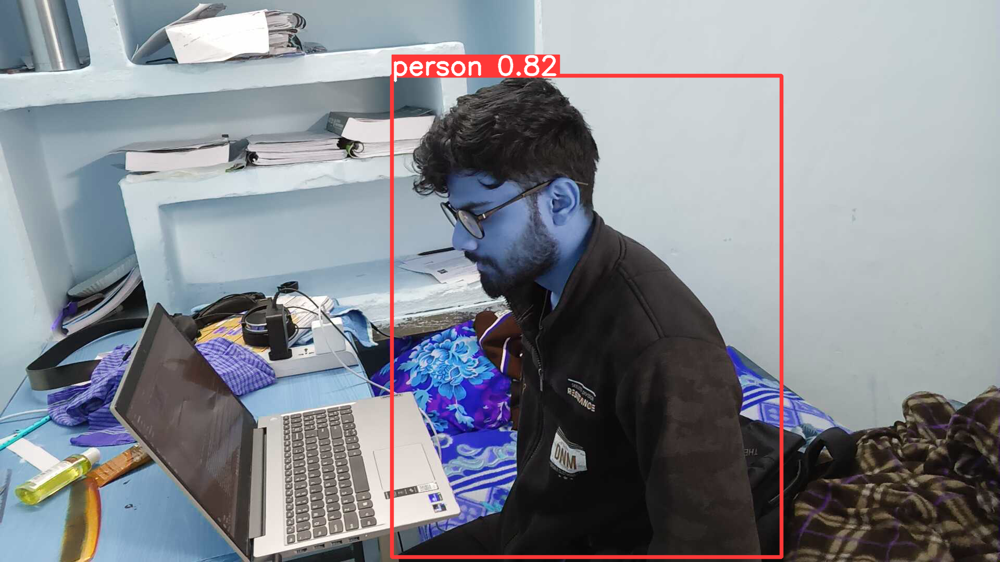

No. of person detected in the scene = 1


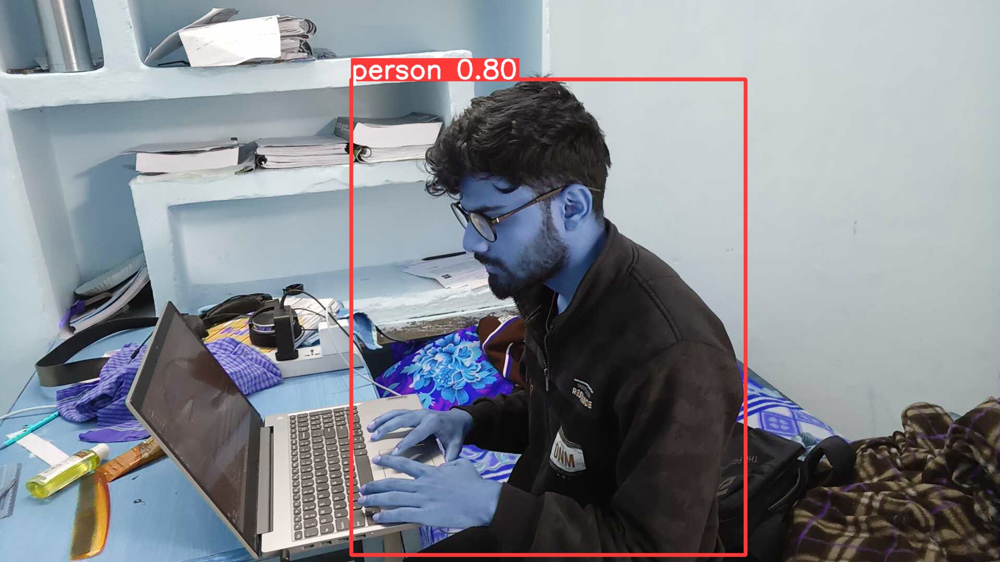

No. of person detected in the scene = 7


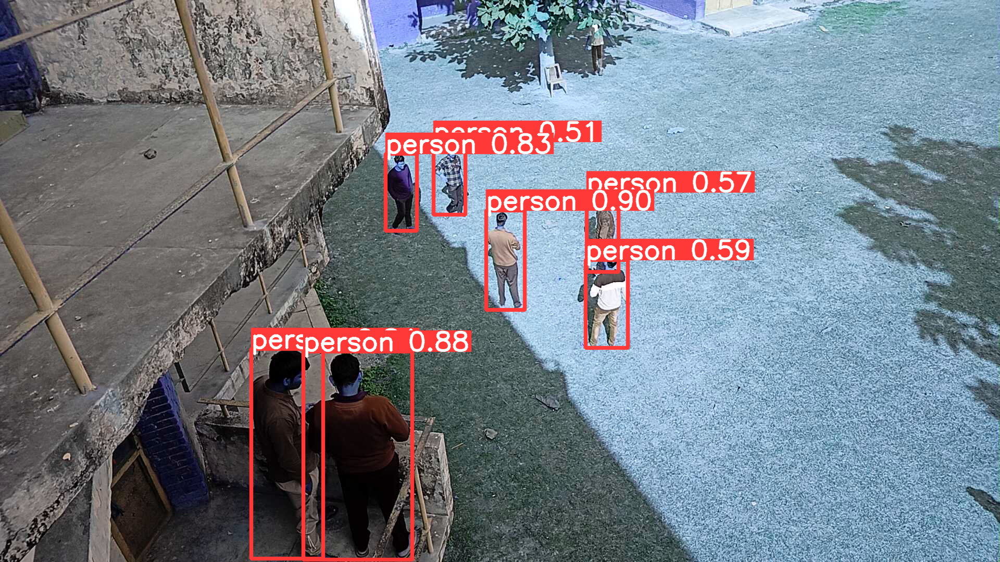

No. of person detected in the scene = 0


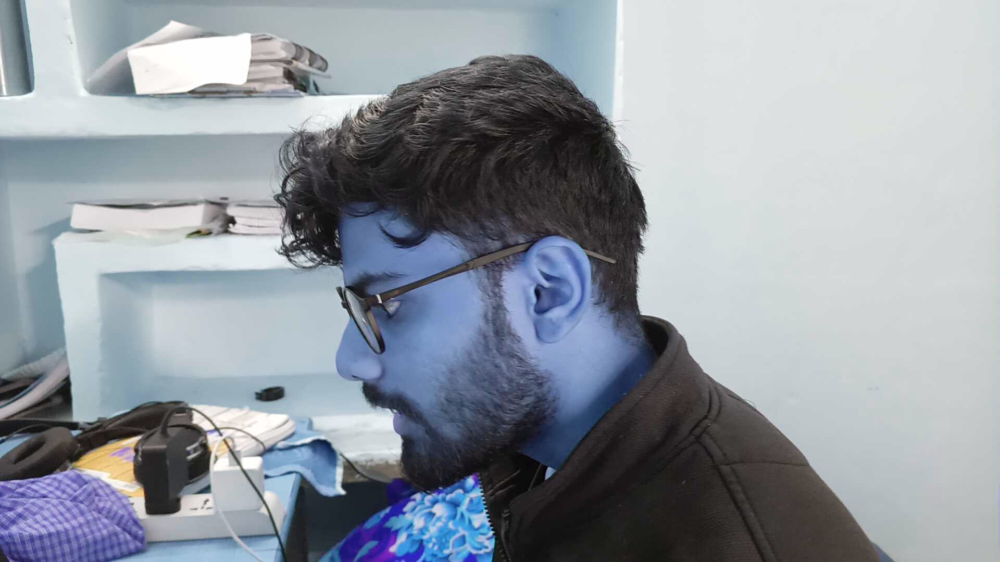

No. of person detected in the scene = 7


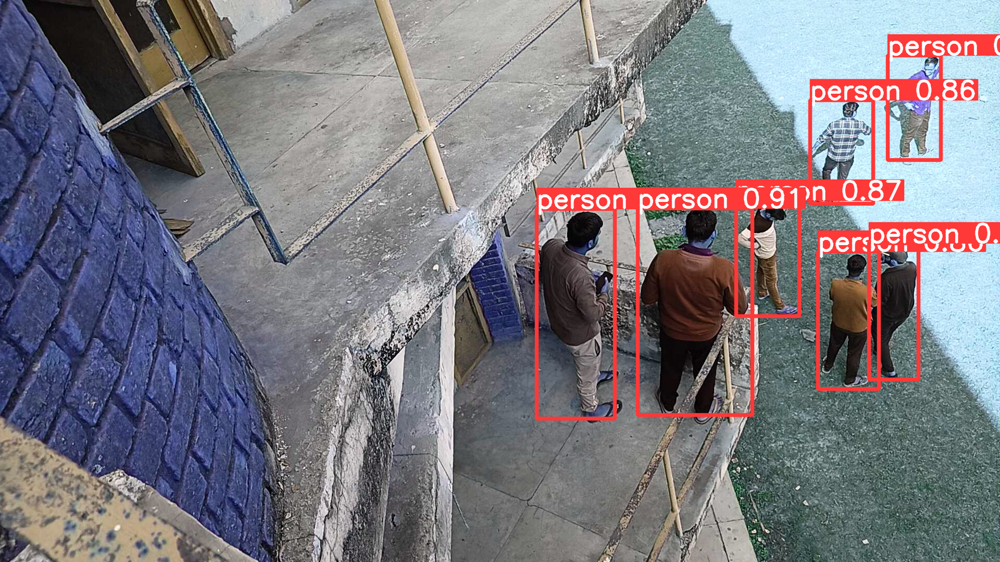

You terminated Detection process.


In [78]:
detector.continuous_detection()

